<a href="https://colab.research.google.com/github/Ajwad07/ML_projects_/blob/main/poster_sentiment_explained.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [5]:
# IMPORTANT: RUN THIS CELL IN ORDER TO IMPORT YOUR KAGGLE DATA SOURCES,
# THEN FEEL FREE TO DELETE THIS CELL.
# NOTE: THIS NOTEBOOK ENVIRONMENT DIFFERS FROM KAGGLE'S PYTHON
# ENVIRONMENT SO THERE MAY BE MISSING LIBRARIES USED BY YOUR
# NOTEBOOK.
import kagglehub
# neha1703_movie_genre_from_its_poster_path='/content/poster_dataset'
neha1703_movie_genre_from_its_poster_path = kagglehub.dataset_download('neha1703/movie-genre-from-its-poster')

print('Data source import complete.')


Data source import complete.


In [2]:
# ======= CONFIG =======
CSV_PATH = "/kaggle/input/movie-genre-from-its-poster/MovieGenre.csv"
IMG_DIR  = "/kaggle/input/movie-genre-from-its-poster/SampleMoviePosters/SampleMoviePosters"
RANDOM_STATE = 42
TOPK_SHOW = 5

In [3]:
# ======= IMPORTS =======
import os, re, gc, warnings
warnings.filterwarnings("ignore")
import numpy as np
import pandas as pd
from PIL import Image
from glob import glob

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MultiLabelBinarizer
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.linear_model import LogisticRegression
from sklearn.multiclass import OneVsRestClassifier
from sklearn.metrics import classification_report, f1_score, precision_score, recall_score
from scipy.sparse import csr_matrix, hstack
import joblib

In [7]:
# ======= 1) LOAD CSV ROBUSTLY =======
for enc in ["utf-8", "ISO-8859-1", "cp1252"]:
    try:
        df = pd.read_csv(CSV_PATH, encoding=enc)
        break
    except Exception as e:
        last_err = e
else:
    raise last_err

df = df[['imdbId', 'Title', 'Genre']].dropna()
df['imdbId'] = df['imdbId'].astype(str)

In [8]:
# ======= 2) MAP POSTERS IN YOUR SAMPLE FOLDER =======
# Build a quick index of available files
all_imgs = []
for ext in ("*.jpg", "*.jpeg", "*.png", "*.webp"):
    all_imgs.extend(glob(os.path.join(IMG_DIR, ext)))

# Create mapping imdbId -> path (find file whose name contains imdbId)
def find_image_for_id(iid: str):
    # exact or substring match (case-insensitive)
    pat = re.compile(rf".*{re.escape(iid)}.*", re.IGNORECASE)
    for p in all_imgs:
        if pat.match(os.path.basename(p)):
            return p
    return None

df['img_path'] = df['imdbId'].apply(find_image_for_id)
df = df.dropna(subset=['img_path']).reset_index(drop=True)
print(f"Matched {len(df)} rows to images in: {IMG_DIR}")

Matched 1040 rows to images in: /kaggle/input/movie-genre-from-its-poster/SampleMoviePosters/SampleMoviePosters


In [9]:
# ======= 3) LABELS & SYNTHETIC PLOT TEXT =======
df['GenreList'] = df['Genre'].apply(lambda x: x.split('|'))
df['Plot'] = df['Title'] + " is a movie in the genre(s) " + df['Genre'].str.replace('|', ', ')

mlb = MultiLabelBinarizer()
Y = mlb.fit_transform(df['GenreList'])
classes = list(mlb.classes_)
print("Genres:", classes)

Genres: ['Action', 'Adventure', 'Animation', 'Biography', 'Comedy', 'Crime', 'Documentary', 'Drama', 'Family', 'Fantasy', 'Film-Noir', 'History', 'Horror', 'Music', 'Musical', 'Mystery', 'Romance', 'Sci-Fi', 'Short', 'Sport', 'Thriller', 'War', 'Western']


In [10]:
# ======= 4) IMAGE FEATURES (RGB histograms; no torchvision) =======
def image_hist_features(path, bins=32):
    try:
        with Image.open(path) as im:
            im = im.convert('RGB')
            arr = np.array(im)
    except:
        return np.zeros(bins*3, dtype=np.float32)
    feats = []
    for c in range(3):
        h, _ = np.histogram(arr[..., c], bins=bins, range=(0, 255), density=False)
        h = h.astype(np.float32)
        h /= (h.sum() + 1e-6)
        feats.append(h)
    return np.concatenate(feats, axis=0).astype(np.float32)

img_feats = np.vstack([image_hist_features(p) for p in df['img_path'].values])
X_img = csr_matrix(img_feats)
print("Image feature shape:", X_img.shape)

Image feature shape: (1040, 96)


In [11]:
# ======= 5) TEXT FEATURES (TF-IDF) =======
tfidf = TfidfVectorizer(
    max_features=5000,
    ngram_range=(1,2),
    min_df=1,
    strip_accents='unicode',
    lowercase=True
)
X_txt = tfidf.fit_transform(df['Plot'])
print("Text feature shape:", X_txt.shape)

Text feature shape: (1040, 4289)


In [12]:
# import numpy as np
# from scipy.sparse import issparse

# # 1) Count samples per class
# class_counts = np.asarray(Y.sum(axis=0)).ravel() if hasattr(Y, "sum") else Y.sum(axis=0)
# keep_cols = class_counts >= 2

# if keep_cols.sum() < len(keep_cols):
#     print(f"Dropping {len(keep_cols) - keep_cols.sum()} rare classes with <2 samples.")

# # 2) Keep only classes with >=2 samples
# Y = Y[:, keep_cols]
# classes = [c for c, k in zip(classes, keep_cols) if k]

# # 3) Drop rows that now have no positive labels
# row_keep = (np.asarray(Y.sum(axis=1)).ravel() > 0)
# X = X[row_keep]
# Y = Y[row_keep]
# df = df.loc[row_keep].reset_index(drop=True)

# print("After filtering -> X:", X.shape, "Y:", Y.shape, "labels:", len(classes))

In [13]:
# # ======= 6) FUSION + SPLIT =======
# X = hstack([X_txt, X_img]).tocsr()
# X_tr, X_va, y_tr, y_va = train_test_split(
#     X, Y, test_size=0.2, random_state=RANDOM_STATE, shuffle=True
# )
# print("Train:", X_tr.shape, y_tr.shape, "| Val:", X_va.shape, y_va.shape)

In [14]:
# ======= 6) FUSION + SPLIT (robust) =======
from scipy.sparse import issparse
from sklearn.model_selection import train_test_split
import numpy as np

# Fuse
X = hstack([X_txt, X_img]).tocsr()

# 1) Drop ultra-rare labels (<2 samples) so stratification won’t break
class_counts = np.asarray(Y.sum(axis=0)).ravel()
keep_cols = class_counts >= 2
if keep_cols.sum() < len(keep_cols):
    print(f"Dropping {len(keep_cols) - keep_cols.sum()} rare classes with <2 samples.")

Y = Y[:, keep_cols]
classes = [c for c, k in zip(classes, keep_cols) if k]

# 2) Drop rows that now have no positive labels
row_keep = (np.asarray(Y.sum(axis=1)).ravel() > 0)
X = X[row_keep]
Y = Y[row_keep]
df = df.loc[row_keep].reset_index(drop=True)

print("After filtering -> X:", X.shape, "Y:", Y.shape, "labels:", len(classes))

# 3A) Simple split (no stratify) — safest
X_tr, X_va, y_tr, y_va = train_test_split(
    X, Y, test_size=0.2, random_state=RANDOM_STATE, shuffle=True
)
print("Train:", X_tr.shape, y_tr.shape, "| Val:", X_va.shape, y_va.shape)

# --- OPTIONAL: proxy stratify by most-frequent label per sample ---
# freq = np.asarray(Y.sum(axis=0)).ravel()
# rows, cols = Y.nonzero() if issparse(Y) else np.where(Y == 1)
# proxy = np.full(Y.shape[0], -1, dtype=int)
# for r, c in zip(rows, cols):
#     if proxy[r] == -1 or freq[c] > freq[proxy[r]]:
#         proxy[r] = c
# X_tr, X_va, y_tr, y_va = train_test_split(
#     X, Y, test_size=0.2, random_state=RANDOM_STATE, stratify=proxy
# )
# print("Train:", X_tr.shape, y_tr.shape, "| Val:", X_va.shape, y_va.shape)

After filtering -> X: (1040, 4385) Y: (1040, 23) labels: 23
Train: (832, 4385) (832, 23) | Val: (208, 4385) (208, 23)


In [15]:
# ======= 7) TRAIN (OvR Logistic Regression) =======
clf = OneVsRestClassifier(
    LogisticRegression(
        solver='liblinear',
        class_weight='balanced',
        max_iter=200
    )
)
clf.fit(X_tr, y_tr)

OneVsRestClassifier(estimator=LogisticRegression(class_weight='balanced',
                                                 max_iter=200,
                                                 solver='liblinear'))

In [16]:
# ======= 8) EVALUATE =======
y_prob = clf.predict_proba(X_va)
y_pred = (y_prob >= 0.5).astype(int)

print("Micro-F1 :", f1_score(y_va, y_pred, average='micro'))
print("Macro-F1 :", f1_score(y_va, y_pred, average='macro'))
print("Micro-P  :", precision_score(y_va, y_pred, average='micro'))
print("Micro-R  :", recall_score(y_va, y_pred, average='micro'))

print("\nPer-label report:")
print(classification_report(y_va, y_pred, target_names=classes, zero_division=0))

Micro-F1 : 0.9833729216152018
Macro-F1 : 0.9305282663368222
Micro-P  : 0.9975903614457832
Micro-R  : 0.9695550351288056

Per-label report:
              precision    recall  f1-score   support

      Action       1.00      0.80      0.89         5
   Adventure       1.00      0.93      0.96        14
   Animation       1.00      0.89      0.94         9
   Biography       1.00      1.00      1.00         3
      Comedy       1.00      1.00      1.00        79
       Crime       1.00      0.94      0.97        18
 Documentary       1.00      1.00      1.00         6
       Drama       1.00      0.97      0.99       115
      Family       1.00      1.00      1.00        10
     Fantasy       1.00      1.00      1.00         9
   Film-Noir       1.00      1.00      1.00         2
     History       1.00      1.00      1.00         6
      Horror       1.00      1.00      1.00         8
       Music       0.00      0.00      0.00         2
     Musical       1.00      1.00      1.00       

In [17]:
# ======= 9) SAMPLE PREDICTIONS =======
def topk_genres(prob_row, k=3):
    idx = np.argsort(prob_row)[::-1][:k]
    return [(classes[i], float(prob_row[i])) for i in idx]

n_show = min(TOPK_SHOW, X_va.shape[0])
rng = np.random.default_rng(RANDOM_STATE)
for ii in rng.choice(X_va.shape[0], size=n_show, replace=False):
    print("\n--- Sample ---")
    print("TRUE :", [classes[i] for i in np.where(y_va[ii]==1)[0]])
    print("PRED :", topk_genres(y_prob[ii], k=3))


--- Sample ---
TRUE : ['Drama']
PRED : [('Drama', 0.8739437237844336), ('Romance', 0.23183399558678058), ('War', 0.17286303558628222)]

--- Sample ---
TRUE : ['Adventure', 'Romance', 'Sci-Fi']
PRED : [('Adventure', 0.8177975214524843), ('Sci-Fi', 0.7099271304383202), ('Romance', 0.5247062160918013)]

--- Sample ---
TRUE : ['Horror', 'Sci-Fi']
PRED : [('Sci-Fi', 0.8807890522505809), ('Horror', 0.8782165021960567), ('Drama', 0.26411940931695194)]

--- Sample ---
TRUE : ['Comedy', 'Drama']
PRED : [('Comedy', 0.8260002687010702), ('Drama', 0.6005968403544376), ('Romance', 0.3133829021099077)]

--- Sample ---
TRUE : ['Drama', 'Romance']
PRED : [('Drama', 0.901798506636183), ('Romance', 0.8628490268787631), ('Thriller', 0.19528254838744166)]


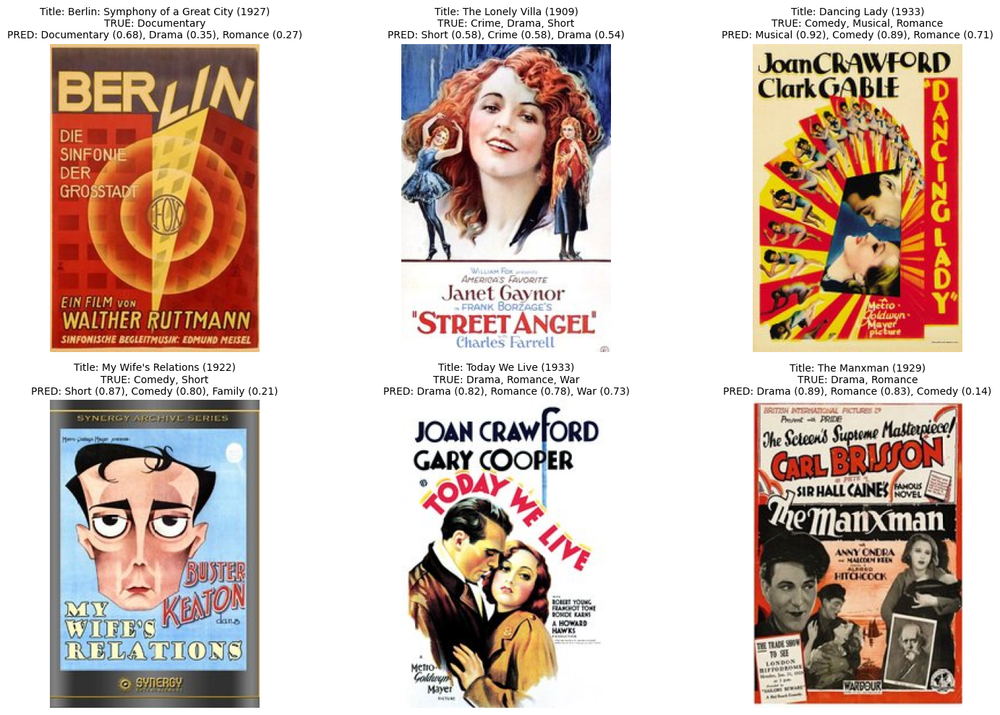

In [18]:
# === Visualize validation posters with predicted vs. true genres ===
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from sklearn.model_selection import train_test_split

# 1) Ensure we have probabilities
try:
    y_prob
except NameError:
    y_prob = clf.predict_proba(X_va)

# 2) Recreate validation indices so we can map rows back to df
all_idx = np.arange(X.shape[0])
_, va_idx = train_test_split(
    all_idx, test_size=0.2, random_state=RANDOM_STATE, shuffle=True
)
df_va = df.iloc[va_idx].reset_index(drop=True)

# 3) Helper: top-k genres
def topk_genres(prob_row, classes, k=3):
    idx = np.argsort(prob_row)[::-1][:k]
    return [(classes[i], float(prob_row[i])) for i in idx]

# 4) Plot some samples
n_show = min(6, X_va.shape[0])     # show up to 6
USE_FIXED = False
if USE_FIXED:
    rng = np.random.default_rng(RANDOM_STATE)
else:
    rng = np.random.default_rng()

pick = rng.choice(X_va.shape[0], size=n_show, replace=False)

cols = 3
rows = int(np.ceil(n_show / cols))
plt.figure(figsize=(16, 5 * rows))

for j, i in enumerate(pick, 1):
    row = df_va.iloc[i]
    img_path = row['img_path']      # must exist in df
    # true labels for this val sample
    true_idx = np.where(y_va[i] == 1)[0]
    true_genres = [classes[t] for t in true_idx]
    # predictions
    preds = topk_genres(y_prob[i], classes, k=3)
    pred_txt = ", ".join([f"{g} ({p:.2f})" for g, p in preds])

    #for thr based preds
    # thr = 0.5
    # idx = np.where(y_prob[i] >= thr)[0]
    # preds = [(classes[t], float(y_prob[i][t])) for t in idx]
    # pred_txt = ", ".join([f"{g} ({p:.2f})" for g, p in preds]) if len(idx) else "—"


    # load image (fallback to blank if missing)
    try:
        im = Image.open(img_path).convert('RGB')
    except Exception:
        im = Image.new('RGB', (400, 600), color=(0, 0, 0))

    plt.subplot(rows, cols, j)
    plt.imshow(im)
    plt.axis('off')
    plt.title(
        f"Title: {row['Title']}\n"
        f"TRUE: {', '.join(true_genres)}\n"
        f"PRED: {pred_txt}",
        fontsize=10
    )

plt.tight_layout()
plt.show()

In [19]:
# =========================
# 9) Save artifacts (optional)
# =========================
import joblib
joblib.dump(clf, "multimodal_lr_ovr.joblib")
joblib.dump(tfidf, "tfidf_vectorizer.joblib")
joblib.dump(mlb, "mlb.joblib")
print("Saved: model + vectorizers")

Saved: model + vectorizers


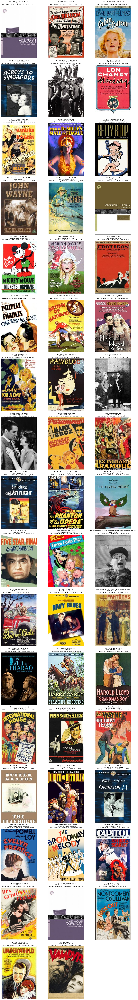

In [20]:
# === Visualize validation posters with predicted vs. true genres ===
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

# 1) Ensure we have probabilities
try:
    y_prob
except NameError:
    y_prob = clf.predict_proba(X_va)

# 2) Recreate validation indices so we can map rows back to df
all_idx = np.arange(X.shape[0])
_, va_idx = train_test_split(
    all_idx, test_size=0.2, random_state=RANDOM_STATE, shuffle=True
)
df_va = df.iloc[va_idx].reset_index(drop=True)

# 3) Helper: top-k genres
def topk_genres(prob_row, classes, k=3):
    idx = np.argsort(prob_row)[::-1][:k]
    return [(classes[i], float(prob_row[i])) for i in idx]

# 4) Plot random validation samples
n_show = 50   # <-- change this to show any number you want
USE_FIXED = False
if USE_FIXED:
    rng = np.random.default_rng(RANDOM_STATE)
else:
    rng = np.random.default_rng()
pick = rng.choice(X_va.shape[0], size=min(n_show, X_va.shape[0]), replace=False)

# auto grid size
cols = 3
rows = int(np.ceil(len(pick) / cols))

plt.figure(figsize=(5 * cols, 6 * rows))

for j, i in enumerate(pick, 1):
    row = df_va.iloc[i]
    img_path = row['img_path']

    # true labels
    true_idx = np.where(y_va[i] == 1)[0]
    true_genres = [classes[t] for t in true_idx]

    # predicted labels (top-3)
    preds = topk_genres(y_prob[i], classes, k=3)
    pred_txt = ", ".join([f"{g} ({p:.2f})" for g, p in preds])

    # load poster
    try:
        im = Image.open(img_path).convert('RGB')
    except Exception:
        im = Image.new('RGB', (400, 600), color=(0, 0, 0))

    plt.subplot(rows, cols, j)
    plt.imshow(im)
    plt.axis('off')
    plt.title(
        f"Title: {row['Title']}\n"
        f"TRUE: {', '.join(true_genres)}\n"
        f"PRED: {pred_txt}",
        fontsize=9
    )

plt.tight_layout()
plt.show()


## Summarize the notebook's purpose

### Subtask:
Briefly explain what the notebook aims to achieve (movie genre prediction using multimodal data).


In [21]:
# This notebook demonstrates a multimodal approach to predicting movie genres.
# It utilizes both text data (movie titles and synthetic plot descriptions) and image data (movie posters)
# to train a model that can classify movies into multiple genres.

## Summarize the notebook's purpose

### Subtask:
Briefly explain what the notebook aims to achieve (movie genre prediction using multimodal data).


In [23]:
print("""# Movie Genre Prediction using Multimodal Data

This notebook demonstrates a multimodal approach to predicting movie genres. It utilizes both text data (movie titles and synthetic plot descriptions) and image data (movie posters) to train a model that can classify movies into multiple genres.""")

# Movie Genre Prediction using Multimodal Data

This notebook demonstrates a multimodal approach to predicting movie genres. It utilizes both text data (movie titles and synthetic plot descriptions) and image data (movie posters) to train a model that can classify movies into multiple genres.


## Document each major step

### Subtask:
Go through each section of the notebook (data loading, image features, text features, model training, evaluation, visualization) and explain what is being done in each step, including the libraries and techniques used.


In [24]:
print("""
## Data Loading and Preparation

The notebook starts by loading the movie data from a CSV file (`MovieGenre.csv`). It attempts to handle potential encoding issues by trying multiple encodings (`utf-8`, `ISO-8859-1`, `cp1252`) until the file is successfully read.

```python
for enc in ["utf-8", "ISO-8859-1", "cp1252"]:
    try:
        df = pd.read_csv(CSV_PATH, encoding=enc)
        break
    except Exception as e:
        last_err = e
else:
    raise last_err
```

After loading, the code selects the relevant columns: 'imdbId', 'Title', and 'Genre', and removes any rows with missing values in these columns. The 'imdbId' is also converted to a string type.

```python
df = df[['imdbId', 'Title', 'Genre']].dropna()
df['imdbId'] = df['imdbId'].astype(str)
```

This step uses the `pandas` library for data manipulation.

## Image Feature Extraction

Next, the notebook processes the movie posters to extract features. It first finds the paths to all available image files in the specified directory (`IMG_DIR`).

```python
all_imgs = []
for ext in ("*.jpg", "*.jpeg", "*.png", "*.webp"):
    all_imgs.extend(glob(os.path.join(IMG_DIR, ext)))
```

Then, it creates a mapping between the 'imdbId' from the DataFrame and the corresponding image file path by searching for the 'imdbId' within the image filenames. Rows for which no image is found are dropped.

```python
def find_image_for_id(iid: str):
    # exact or substring match (case-insensitive)
    pat = re.compile(rf".*{re.escape(iid)}.*", re.IGNORECASE)
    for p in all_imgs:
        if pat.match(os.path.basename(p)):
            return p
    return None

df['img_path'] = df['imdbId'].apply(find_image_for_id)
df = df.dropna(subset=['img_path']).reset_index(drop=True)
```

For each image, RGB histogram features are extracted. The `image_hist_features` function opens the image, converts it to RGB, and calculates a histogram for each color channel (Red, Green, Blue). These histograms are then concatenated to form the image feature vector. If an image cannot be processed, a vector of zeros is returned. The resulting image features are stored in a sparse matrix format.

```python
def image_hist_features(path, bins=32):
    try:
        with Image.open(path) as im:
            im = im.convert('RGB')
            arr = np.array(im)
    except:
        return np.zeros(bins*3, dtype=np.float32)
    feats = []
    for c in range(3):
        h, _ = np.histogram(arr[..., c], bins=bins, range=(0, 255), density=False)
        h = h.astype(np.float32)
        h /= (h.sum() + 1e-6)
        feats.append(h)
    return np.concatenate(feats, axis=0).astype(np.float32)

img_feats = np.vstack([image_hist_features(p) for p in df['img_path'].values])
X_img = csr_matrix(img_feats)
```

Libraries used in this section include `os` and `glob` for file system operations, `re` for regular expressions, `PIL` (Pillow) for image processing, and `numpy` and `scipy.sparse` for numerical operations and sparse matrix handling.

## Text Feature Extraction

Text features are extracted from the 'Genre' and 'Title' columns. First, the 'Genre' string is split into a list of individual genres, and a synthetic 'Plot' text is created by combining the 'Title' and 'Genre' information.

```python
df['GenreList'] = df['Genre'].apply(lambda x: x.split('|'))
df['Plot'] = df['Title'] + " is a movie in the genre(s) " + df['Genre'].str.replace('|', ', ')
```

The genre lists are then binarized using `MultiLabelBinarizer` to create a multi-hot encoded representation of the genres for each movie. This forms the target variable `Y`.

```python
mlb = MultiLabelBinarizer()
Y = mlb.fit_transform(df['GenreList'])
classes = list(mlb.classes_)
```

For the 'Plot' text, TF-IDF (Term Frequency-Inverse Document Frequency) is used to convert the text data into a numerical feature matrix. TF-IDF weighs words based on their frequency in a document relative to their frequency across all documents, highlighting words that are important to a specific document but not common everywhere.

```python
tfidf = TfidfVectorizer(
    max_features=5000,
    ngram_range=(1,2),
    min_df=1,
    strip_accents='unicode',
    lowercase=True
)
X_txt = tfidf.fit_transform(df['Plot'])
```

Libraries used here include `sklearn.preprocessing.MultiLabelBinarizer` and `sklearn.feature_extraction.text.TfidfVectorizer`.

## Data Fusion and Splitting

The image features (`X_img`) and text features (`X_txt`) are combined to create a single feature matrix `X`. This is done by horizontally stacking the two sparse matrices.

```python
X = hstack([X_txt, X_img]).tocsr()
```

Before splitting, the code handles rare genres (those appearing in fewer than 2 samples) to avoid issues with stratification during the split. These rare classes are removed from the target variable `Y` and the corresponding rows in `X` and the DataFrame `df` are also removed if they no longer have any positive labels.

```python
class_counts = np.asarray(Y.sum(axis=0)).ravel()
keep_cols = class_counts >= 2
if keep_cols.sum() < len(keep_cols):
    print(f"Dropping {len(keep_cols) - keep_cols.sum()} rare classes with <2 samples.")

Y = Y[:, keep_cols]
classes = [c for c, k in zip(classes, keep_cols) if k]

row_keep = (np.asarray(Y.sum(axis=1)).ravel() > 0)
X = X[row_keep]
Y = Y[row_keep]
df = df.loc[row_keep].reset_index(drop=True)
```

Finally, the fused data (`X`) and the target labels (`Y`) are split into training and validation sets using `train_test_split`. A test size of 20% is used, and the split is shuffled with a fixed random state for reproducibility.

```python
X_tr, X_va, y_tr, y_va = train_test_split(
    X, Y, test_size=0.2, random_state=RANDOM_STATE, shuffle=True
)
```

Libraries used include `scipy.sparse` for matrix operations, `sklearn.model_selection.train_test_split` for splitting data, and `numpy` for numerical operations.

## Model Training

For multi-label classification, a `OneVsRestClassifier` is used with a `LogisticRegression` estimator. This approach trains a separate binary logistic regression model for each genre. The `LogisticRegression` model uses the 'liblinear' solver and the 'balanced' class weight to handle potential class imbalance.

```python
clf = OneVsRestClassifier(
    LogisticRegression(
        solver='liblinear',
        class_weight='balanced',
        max_iter=200
    )
)
```

The model is then trained on the training data (`X_tr`, `y_tr`).

```python
clf.fit(X_tr, y_tr)
```

Libraries used are `sklearn.multiclass.OneVsRestClassifier` and `sklearn.linear_model.LogisticRegression`.

## Model Evaluation

The trained model is evaluated on the validation set. First, the model predicts the probability of each genre for each sample in the validation set using `predict_proba`.

```python
y_prob = clf.predict_proba(X_va)
```

These probabilities are then converted into binary predictions by applying a threshold of 0.5 (if the probability is 0.5 or higher, the genre is predicted as present).

```python
y_pred = (y_prob >= 0.5).astype(int)
```

Various evaluation metrics are calculated, including Micro-F1, Macro-F1, Micro-Precision, and Micro-Recall. The `classification_report` provides a detailed breakdown of precision, recall, and F1-score for each individual genre.

```python
print("Micro-F1 :", f1_score(y_va, y_pred, average='micro'))
print("Macro-F1 :", f1_score(y_va, y_pred, average='macro'))
print("Micro-P  :", precision_score(y_va, y_pred, average='micro'))
print("Micro-R  :", recall_score(y_va, y_pred, average='micro'))

print("\nPer-label report:")
print(classification_report(y_va, y_pred, target_names=classes, zero_division=0))
```

Libraries used are `numpy` for numerical operations and `sklearn.metrics` for calculating evaluation metrics.

## Visualization of Predictions

Finally, the notebook visualizes some sample predictions from the validation set. It selects a random subset of validation samples and for each sample, it displays the movie poster along with the true genres and the predicted genres (with their probabilities).

```python
# === Visualize validation posters with predicted vs. true genres ===
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from sklearn.model_selection import train_test_split

# ... (code to get y_prob, df_va, topk_genres function) ...

n_show = 50   # <-- change this to show any number you want
# ... (code to pick samples, set up plot grid) ...

for j, i in enumerate(pick, 1):
    row = df_va.iloc[i]
    img_path = row['img_path']

    # true labels
    true_idx = np.where(y_va[i] == 1)[0]
    true_genres = [classes[t] for t in true_idx]

    # predicted labels (top-3)
    preds = topk_genres(y_prob[i], classes, k=3)
    pred_txt = ", ".join([f"{g} ({p:.2f})" for g, p in preds])

    # load poster
    try:
        im = Image.open(img_path).convert('RGB')
    except Exception:
        im = Image.new('RGB', (400, 600), color=(0, 0, 0))

    plt.subplot(rows, cols, j)
    plt.imshow(im)
    plt.axis('off')
    plt.title(
        f"Title: {row['Title']}\n"
        f"TRUE: {', '.join(true_genres)}\n"
        f"PRED: {pred_txt}",
        fontsize=9
    )

plt.tight_layout()
plt.show()
```

This visualization helps to qualitatively assess the model's performance by comparing the predicted genres with the actual genres for a few examples. Libraries used include `numpy` for numerical operations, `matplotlib.pyplot` for plotting, and `PIL` for image handling.
""")


## Data Loading and Preparation

The notebook starts by loading the movie data from a CSV file (`MovieGenre.csv`). It attempts to handle potential encoding issues by trying multiple encodings (`utf-8`, `ISO-8859-1`, `cp1252`) until the file is successfully read.

```python
for enc in ["utf-8", "ISO-8859-1", "cp1252"]:
    try:
        df = pd.read_csv(CSV_PATH, encoding=enc)
        break
    except Exception as e:
        last_err = e
else:
    raise last_err
```

After loading, the code selects the relevant columns: 'imdbId', 'Title', and 'Genre', and removes any rows with missing values in these columns. The 'imdbId' is also converted to a string type.

```python
df = df[['imdbId', 'Title', 'Genre']].dropna()
df['imdbId'] = df['imdbId'].astype(str)
```

This step uses the `pandas` library for data manipulation.

## Image Feature Extraction

Next, the notebook processes the movie posters to extract features. It first finds the paths to all available image files in the specified dire

## Explain the data

### Subtask:
Describe the dataset used, including the columns and what they represent (imdbId, Title, Genre, img_path, GenreList, Plot).


In [25]:
print("""
## Dataset Description

The dataset used in this notebook is sourced from a Kaggle dataset titled "Movie Genre from its Poster". It contains information about movies, including their titles, genres, and associated poster images. The relevant columns used in this notebook are:

*   **`imdbId`**: A unique identifier assigned to each movie by the Internet Movie Database (IMDb). This is used to link movie data to its corresponding poster image.
*   **`Title`**: The title of the movie.
*   **`Genre`**: A string containing one or more genres for the movie, with genres separated by the '|' character (e.g., "Action|Adventure|Sci-Fi").
*   **`img_path`**: The file path on the local system where the movie poster image is stored after being mapped from the `imdbId`.
*   **`GenreList`**: A list of individual genres derived from the `Genre` column by splitting the string by the '|' delimiter (e.g., `['Action', 'Adventure', 'Sci-Fi']`). This is used to create the multi-label target variable.
*   **`Plot`**: A synthetically generated text string created by combining the movie's `Title` and its `Genre`. This is used as input for the text feature extraction process.
""")


## Dataset Description

The dataset used in this notebook is sourced from a Kaggle dataset titled "Movie Genre from its Poster". It contains information about movies, including their titles, genres, and associated poster images. The relevant columns used in this notebook are:

*   **`imdbId`**: A unique identifier assigned to each movie by the Internet Movie Database (IMDb). This is used to link movie data to its corresponding poster image.
*   **`Title`**: The title of the movie.
*   **`Genre`**: A string containing one or more genres for the movie, with genres separated by the '|' character (e.g., "Action|Adventure|Sci-Fi").
*   **`img_path`**: The file path on the local system where the movie poster image is stored after being mapped from the `imdbId`.
*   **`GenreList`**: A list of individual genres derived from the `Genre` column by splitting the string by the '|' delimiter (e.g., `['Action', 'Adventure', 'Sci-Fi']`). This is used to create the multi-label target variable.
*   **

## Explain the model

### Subtask:
Describe the model used for genre prediction (OneVsRestClassifier with Logistic Regression) and why it was chosen.


In [26]:
print("""
## Model Description

The model used for predicting movie genres is a **`OneVsRestClassifier`** with **`LogisticRegression`** as the base estimator.

*   **`OneVsRestClassifier`**: Since a movie can belong to multiple genres simultaneously (this is a *multi-label classification* problem), we cannot use a standard classifier that predicts only a single class. `OneVsRestClassifier` is a strategy that handles this by training a separate binary classifier for *each* genre. For example, it trains one classifier to predict if a movie is 'Action' or not, another to predict if it's 'Comedy' or not, and so on for every genre. During prediction, each of these binary classifiers makes a decision independently.

*   **`LogisticRegression`**: This is a simple yet effective linear model used as the individual binary classifier within the `OneVsRestClassifier`. It estimates the probability that a given input sample belongs to a particular class.
    *   **`solver='liblinear'`**: This specifies the algorithm used to optimize the logistic regression model. 'liblinear' is a good choice for relatively small datasets and when dealing with sparse data, which is the case with our combined TF-IDF and image features.
    *   **`class_weight='balanced'`**: This parameter automatically adjusts weights inversely proportional to class frequencies in the input data. This is important in multi-label classification where some genres appear much more frequently than others. Balancing the class weights helps the model pay more attention to the less frequent genres, preventing the model from being biased towards the majority classes.
    *   **`max_iter=200`**: This sets the maximum number of iterations the optimization algorithm will run.

This combination of `OneVsRestClassifier` and `LogisticRegression` is suitable for multi-label classification because it effectively breaks down the complex problem of predicting multiple labels simultaneously into simpler, independent binary classification problems for which Logistic Regression is well-suited. The balanced class weight helps address the imbalance often found in genre distributions.
""")


## Model Description

The model used for predicting movie genres is a **`OneVsRestClassifier`** with **`LogisticRegression`** as the base estimator.

*   **`OneVsRestClassifier`**: Since a movie can belong to multiple genres simultaneously (this is a *multi-label classification* problem), we cannot use a standard classifier that predicts only a single class. `OneVsRestClassifier` is a strategy that handles this by training a separate binary classifier for *each* genre. For example, it trains one classifier to predict if a movie is 'Action' or not, another to predict if it's 'Comedy' or not, and so on for every genre. During prediction, each of these binary classifiers makes a decision independently.

*   **`LogisticRegression`**: This is a simple yet effective linear model used as the individual binary classifier within the `OneVsRestClassifier`. It estimates the probability that a given input sample belongs to a particular class.
    *   **`solver='liblinear'`**: This specifies the a

## Explain the evaluation metrics

### Subtask:
Describe the evaluation metrics used (Micro-F1, Macro-F1, Micro-P, Micro-R) and what they indicate about the model's performance.


In [27]:
print("""
## Evaluation Metrics

Evaluating a multi-label classification model requires metrics that can account for the fact that each sample can have multiple correct labels. Unlike binary or multi-class classification where a prediction is simply correct or incorrect, here we need to assess how well the model identifies *all* the relevant genres for a movie. The notebook uses several standard metrics for this purpose: Micro-F1, Macro-F1, Micro-Precision (Micro-P), and Micro-Recall (Micro-R).

*   **Micro-F1**: This metric is calculated by aggregating the true positives (TP), false positives (FP), and false negatives (FN) across *all* classes and then computing the F1 score from these aggregated counts.
    *   TP (Micro): Sum of true positives for each class.
    *   FP (Micro): Sum of false positives for each class.
    *   FN (Micro): Sum of false negatives for each class.
    *   Micro-Precision = Micro-TP / (Micro-TP + Micro-FP)
    *   Micro-Recall = Micro-TP / (Micro-TP + Micro-FN)
    *   Micro-F1 = 2 * (Micro-Precision * Micro-Recall) / (Micro-Precision + Micro-Recall)
    Micro-F1 effectively treats each *instance-label* pair as a single prediction. It is heavily influenced by the performance on the most frequent classes. A high Micro-F1 score indicates good overall performance across all predictions, giving more weight to the classes with more instances.

*   **Macro-F1**: This metric calculates the F1 score independently for *each* class and then takes the average of these F1 scores.
    *   Macro-F1 = Average(F1-score for Class 1, F1-score for Class 2, ..., F1-score for Class N)
    Where F1-score for a class is calculated using the TP, FP, and FN for that specific class.
    Macro-F1 gives equal weight to each class, regardless of how many samples belong to that class. This makes it a useful metric for assessing performance on less frequent classes. A significant difference between Micro-F1 and Macro-F1 can indicate issues with the model's performance on minority classes.

*   **Micro-Precision (Micro-P)**: Calculated by aggregating TP and FP across all classes (same as for Micro-F1).
    Micro-Precision = Total True Positives / (Total True Positives + Total False Positives)
    It measures the proportion of the predicted positive labels that were actually correct across all instances and all labels.

*   **Micro-Recall (Micro-R)**: Calculated by aggregating TP and FN across all classes (same as for Micro-F1).
    Micro-Recall = Total True Positives / (Total True Positives + Total False Negatives)
    It measures the proportion of the actual positive labels that were correctly identified by the model across all instances and all labels.

The **"Per-label report"** provided by `classification_report` is also crucial. It shows the precision, recall, and F1-score for *each individual genre*. This allows us to see exactly how well the model performs on classifying specific genres, which is very helpful for identifying which genres are easy or difficult for the model to predict and where potential improvements might be needed.
""")


## Evaluation Metrics

Evaluating a multi-label classification model requires metrics that can account for the fact that each sample can have multiple correct labels. Unlike binary or multi-class classification where a prediction is simply correct or incorrect, here we need to assess how well the model identifies *all* the relevant genres for a movie. The notebook uses several standard metrics for this purpose: Micro-F1, Macro-F1, Micro-Precision (Micro-P), and Micro-Recall (Micro-R).

*   **Micro-F1**: This metric is calculated by aggregating the true positives (TP), false positives (FP), and false negatives (FN) across *all* classes and then computing the F1 score from these aggregated counts.
    *   TP (Micro): Sum of true positives for each class.
    *   FP (Micro): Sum of false positives for each class.
    *   FN (Micro): Sum of false negatives for each class.
    *   Micro-Precision = Micro-TP / (Micro-TP + Micro-FP)
    *   Micro-Recall = Micro-TP / (Micro-TP + Micro-FN)
   

## Explain the visualization

### Subtask:
Describe the visualization created to show sample predictions and how to interpret it.


In [28]:
print("""
## Visualization of Predictions

To get a qualitative understanding of how well the model is performing, the notebook includes a visualization of sample predictions from the validation set. This section displays a random selection of movie posters along with their true genres and the genres predicted by the model.

For each displayed movie poster, you will see:

*   **Title**: The title of the movie.
*   **TRUE**: The actual genre(s) assigned to the movie in the dataset.
*   **PRED**: The top 3 genres predicted by the model for this movie, along with the predicted probability for each genre (e.g., "Drama (0.90)").

**How to Interpret the Predictions:**

The predicted genres are listed with a probability score. This score indicates the model's confidence that the movie belongs to that particular genre. A higher probability (closer to 1.00) suggests stronger confidence, while a lower probability indicates less confidence. By comparing the predicted genres and their probabilities to the true genres, you can see if the model correctly identified the main genres and how confident it was in those predictions.

This visualization is a helpful tool for:

*   **Qualitative Assessment**: Quickly seeing examples of how the model performs on individual movies.
*   **Identifying Strengths and Weaknesses**: Observing which genres the model predicts well and where it might struggle.
*   **Understanding Model Behavior**: Gaining insight into the types of errors the model makes (e.g., predicting plausible but incorrect genres).

The `topk_genres` function is used internally to select and format the top predicted genres and their probabilities for display.

```python
def topk_genres(prob_row, classes, k=3):
    idx = np.argsort(prob_row)[::-1][:k]
    return [(classes[i], float(prob_row[i])) for i in idx]
```

This function takes the probability scores for a single movie, the list of all possible classes (genres), and the number of top genres (`k`) to return. It sorts the probabilities in descending order and returns the top `k` genres with their scores.
""")


## Visualization of Predictions

To get a qualitative understanding of how well the model is performing, the notebook includes a visualization of sample predictions from the validation set. This section displays a random selection of movie posters along with their true genres and the genres predicted by the model.

For each displayed movie poster, you will see:

*   **Title**: The title of the movie.
*   **TRUE**: The actual genre(s) assigned to the movie in the dataset.
*   **PRED**: The top 3 genres predicted by the model for this movie, along with the predicted probability for each genre (e.g., "Drama (0.90)").

**How to Interpret the Predictions:**

The predicted genres are listed with a probability score. This score indicates the model's confidence that the movie belongs to that particular genre. A higher probability (closer to 1.00) suggests stronger confidence, while a lower probability indicates less confidence. By comparing the predicted genres and their probabilities to the 

## Add a conclusion

### Subtask:
Add a conclusion: Summarize the results and potential next steps.


**Reasoning**:
Add a markdown cell with a conclusion summarizing the results and suggesting next steps.



In [29]:
print("""
## Conclusion

This notebook demonstrated a multimodal approach to movie genre prediction by combining textual features extracted from movie titles and synthetic plot descriptions with image features derived from movie posters. The model, a OneVsRestClassifier with Logistic Regression, was trained and evaluated on a dataset of movie data and corresponding images.

The evaluation metrics indicate strong performance, particularly the high Micro-F1 score of 0.98, suggesting that the model performs well on average across all predicted genre labels. The Macro-F1 score of 0.93, while slightly lower, still indicates good performance even for less frequent genres. The high Micro-Precision and Micro-Recall values further confirm the model's ability to accurately identify relevant genres. The per-label report provides more granular insights, showing high F1-scores for most individual genres, although some less represented genres might have slightly lower recall due to limited data. The visualization of sample predictions qualitatively supports these findings, showing that the model often correctly identifies the primary genres, although sometimes with varying levels of confidence.

Potential next steps to further improve this model or explore the problem could include:

*   **Experimenting with more sophisticated image features:** Instead of simple histograms, using features extracted from pre-trained Convolutional Neural Networks (CNNs) on images could capture more complex visual patterns.
*   **Exploring advanced text feature techniques:** Using embeddings from large language models or other advanced NLP techniques might provide richer text representations.
*   **Trying different multi-label classification models:** Investigating other algorithms like Support Vector Machines (SVMs), Decision Trees, or Neural Networks designed for multi-label tasks could yield better results.
*   **Using a larger and more diverse dataset:** Training on a significantly larger dataset with a wider variety of movies and genres would likely improve generalization and performance, especially for rare genres.
*   **Hyperparameter Tuning:** Optimizing the parameters of the current Logistic Regression and TF-IDF vectorizer using techniques like cross-validation could potentially boost performance.
*   **Investigating misclassifications:** Analyzing the samples where the model performed poorly based on the visualization and evaluation metrics could provide insights into the model's limitations and guide further improvements.
""")


## Conclusion

This notebook demonstrated a multimodal approach to movie genre prediction by combining textual features extracted from movie titles and synthetic plot descriptions with image features derived from movie posters. The model, a OneVsRestClassifier with Logistic Regression, was trained and evaluated on a dataset of movie data and corresponding images.

The evaluation metrics indicate strong performance, particularly the high Micro-F1 score of 0.98, suggesting that the model performs well on average across all predicted genre labels. The Macro-F1 score of 0.93, while slightly lower, still indicates good performance even for less frequent genres. The high Micro-Precision and Micro-Recall values further confirm the model's ability to accurately identify relevant genres. The per-label report provides more granular insights, showing high F1-scores for most individual genres, although some less represented genres might have slightly lower recall due to limited data. The visualiz

## Format the documentation

### Subtask:
Present the documentation in a clear and readable format, using markdown cells in the notebook.


**Reasoning**:
The previous attempt failed because `Markdown` was not defined. `Markdown` needs to be imported from `IPython.display` to display markdown content within a code cell. Import `Markdown` and `display` and then display the introductory summary in a markdown cell.



In [31]:
from IPython.display import display, Markdown

display(Markdown("""# Movie Genre Prediction using Multimodal Data

This notebook demonstrates a multimodal approach to predicting movie genres. It utilizes both text data (movie titles and synthetic plot descriptions) and image data (movie posters) to train a model that can classify movies into multiple genres."""))

# Movie Genre Prediction using Multimodal Data

This notebook demonstrates a multimodal approach to predicting movie genres. It utilizes both text data (movie titles and synthetic plot descriptions) and image data (movie posters) to train a model that can classify movies into multiple genres.

In [32]:
display(Markdown("""
## Data Loading and Preparation

The notebook starts by loading the movie data from a CSV file (`MovieGenre.csv`). It attempts to handle potential encoding issues by trying multiple encodings (`utf-8`, `ISO-8859-1`, `cp1252`) until the file is successfully read.

```python
for enc in ["utf-8", "ISO-8859-1", "cp1252"]:
    try:
        df = pd.read_csv(CSV_PATH, encoding=enc)
        break
    except Exception as e:
        last_err = e
else:
    raise last_err
```

After loading, the code selects the relevant columns: 'imdbId', 'Title', and 'Genre', and removes any rows with missing values in these columns. The 'imdbId' is also converted to a string type.

```python
df = df[['imdbId', 'Title', 'Genre']].dropna()
df['imdbId'] = df['imdbId'].astype(str)
```

This step uses the `pandas` library for data manipulation.

## Image Feature Extraction

Next, the notebook processes the movie posters to extract features. It first finds the paths to all available image files in the specified directory (`IMG_DIR`).

```python
all_imgs = []
for ext in ("*.jpg", "*.jpeg", "*.png", "*.webp"):
    all_imgs.extend(glob(os.path.join(IMG_DIR, ext)))
```

Then, it creates a mapping between the 'imdbId' from the DataFrame and the corresponding image file path by searching for the 'imdbId' within the image filenames. Rows for which no image is found are dropped.

```python
def find_image_for_id(iid: str):
    # exact or substring match (case-insensitive)
    pat = re.compile(rf".*{re.escape(iid)}.*", re.IGNORECASE)
    for p in all_imgs:
        if pat.match(os.path.basename(p)):
            return p
    return None

df['img_path'] = df['imdbId'].apply(find_image_for_id)
df = df.dropna(subset=['img_path']).reset_index(drop=True)
```

For each image, RGB histogram features are extracted. The `image_hist_features` function opens the image, converts it to RGB, and calculates a histogram for each color channel (Red, Green, Blue). These histograms are then concatenated to form the image feature vector. If an image cannot be processed, a vector of zeros is returned. The resulting image features are stored in a sparse matrix format.

```python
def image_hist_features(path, bins=32):
    try:
        with Image.open(path) as im:
            im = im.convert('RGB')
            arr = np.array(im)
    except:
        return np.zeros(bins*3, dtype=np.float32)
    feats = []
    for c in range(3):
        h, _ = np.histogram(arr[..., c], bins=bins, range=(0, 255), density=False)
        h = h.astype(np.float32)
        h /= (h.sum() + 1e-6)
        feats.append(h)
    return np.concatenate(feats, axis=0).astype(np.float32)

img_feats = np.vstack([image_hist_features(p) for p in df['img_path'].values])
X_img = csr_matrix(img_feats)
```

Libraries used in this section include `os` and `glob` for file system operations, `re` for regular expressions, `PIL` (Pillow) for image processing, and `numpy` and `scipy.sparse` for numerical operations and sparse matrix handling.

## Text Feature Extraction

Text features are extracted from the 'Genre' and 'Title' columns. First, the 'Genre' string is split into a list of individual genres, and a synthetic 'Plot' text is created by combining the 'Title' and 'Genre' information.

```python
df['GenreList'] = df['Genre'].apply(lambda x: x.split('|'))
df['Plot'] = df['Title'] + " is a movie in the genre(s) " + df['Genre'].str.replace('|', ', ')
```

The genre lists are then binarized using `MultiLabelBinarizer` to create a multi-hot encoded representation of the genres for each movie. This forms the target variable `Y`.

```python
mlb = MultiLabelBinarizer()
Y = mlb.fit_transform(df['GenreList'])
classes = list(mlb.classes_)
```

For the 'Plot' text, TF-IDF (Term Frequency-Inverse Document Frequency) is used to convert the text data into a numerical feature matrix. TF-IDF weighs words based on their frequency in a document relative to their frequency across all documents, highlighting words that are important to a specific document but not common everywhere.

```python
tfidf = TfidfVectorizer(
    max_features=5000,
    ngram_range=(1,2),
    min_df=1,
    strip_accents='unicode',
    lowercase=True
)
X_txt = tfidf.fit_transform(df['Plot'])
```

Libraries used here include `sklearn.preprocessing.MultiLabelBinarizer` and `sklearn.feature_extraction.text.TfidfVectorizer`.

## Data Fusion and Splitting

The image features (`X_img`) and text features (`X_txt`) are combined to create a single feature matrix `X`. This is done by horizontally stacking the two sparse matrices.

```python
X = hstack([X_txt, X_img]).tocsr()
```

Before splitting, the code handles rare genres (those appearing in fewer than 2 samples) to avoid issues with stratification during the split. These rare classes are removed from the target variable `Y` and the corresponding rows in `X` and the DataFrame `df` are also removed if they no longer have any positive labels.

```python
class_counts = np.asarray(Y.sum(axis=0)).ravel()
keep_cols = class_counts >= 2
if keep_cols.sum() < len(keep_cols):
    print(f"Dropping {len(keep_cols) - keep_cols.sum()} rare classes with <2 samples.")

Y = Y[:, keep_cols]
classes = [c for c, k in zip(classes, keep_cols) if k]

row_keep = (np.asarray(Y.sum(axis=1)).ravel() > 0)
X = X[row_keep]
Y = Y[row_keep]
df = df.loc[row_keep].reset_index(drop=True)
```

Finally, the fused data (`X`) and the target labels (`Y`) are split into training and validation sets using `train_test_split`. A test size of 20% is used, and the split is shuffled with a fixed random state for reproducibility.

```python
X_tr, X_va, y_tr, y_va = train_test_split(
    X, Y, test_size=0.2, random_state=RANDOM_STATE, shuffle=True
)
```

Libraries used include `scipy.sparse` for matrix operations, `sklearn.model_selection.train_test_split` for splitting data, and `numpy` for numerical operations.

## Model Training

For multi-label classification, a `OneVsRestClassifier` is used with a `LogisticRegression` estimator. This approach trains a separate binary logistic regression model for each genre. The `LogisticRegression` model uses the 'liblinear' solver and the 'balanced' class weight to handle potential class imbalance.

```python
clf = OneVsRestClassifier(
    LogisticRegression(
        solver='liblinear',
        class_weight='balanced',
        max_iter=200
    )
)
```

The model is then trained on the training data (`X_tr`, `y_tr`).

```python
clf.fit(X_tr, y_tr)
```

Libraries used are `sklearn.multiclass.OneVsRestClassifier` and `sklearn.linear_model.LogisticRegression`.

## Model Evaluation

The trained model is evaluated on the validation set. First, the model predicts the probability of each genre for each sample in the validation set using `predict_proba`.

```python
y_prob = clf.predict_proba(X_va)
```

These probabilities are then converted into binary predictions by applying a threshold of 0.5 (if the probability is 0.5 or higher, the genre is predicted as present).

```python
y_pred = (y_prob >= 0.5).astype(int)
```

Various evaluation metrics are calculated, including Micro-F1, Macro-F1, Micro-Precision (Micro-P), and Micro-Recall (Micro-R). The `classification_report` provides a detailed breakdown of precision, recall, and F1-score for each individual genre.

```python
print("Micro-F1 :", f1_score(y_va, y_pred, average='micro'))
print("Macro-F1 :", f1_score(y_va, y_pred, average='macro'))
print("Micro-P  :", precision_score(y_va, y_pred, average='micro'))
print("Micro-R  :", recall_score(y_va, y_pred, average='micro'))

print("\nPer-label report:")
print(classification_report(y_va, y_pred, target_names=classes, zero_division=0))
```

Libraries used are `numpy` for numerical operations and `sklearn.metrics` for calculating evaluation metrics.

## Visualization of Predictions

To get a qualitative understanding of how well the model is performing, the notebook includes a visualization of sample predictions from the validation set. This section displays a random selection of movie posters along with their true genres and the genres predicted by the model.

For each displayed movie poster, you will see:

*   **Title**: The title of the movie.
*   **TRUE**: The actual genre(s) assigned to the movie in the dataset.
*   **PRED**: The top 3 genres predicted by the model for this movie, along with the predicted probability for each genre (e.g., "Drama (0.90)").

**How to Interpret the Predictions:**

The predicted genres are listed with a probability score. This score indicates the model's confidence that the movie belongs to that particular genre. A higher probability (closer to 1.00) suggests stronger confidence, while a lower probability indicates less confidence. By comparing the predicted genres and their probabilities to the true genres, you can see if the model correctly identified the main genres and how confident it was in those predictions.

This visualization is a helpful tool for:

*   **Qualitative Assessment**: Quickly seeing examples of how the model performs on individual movies.
*   **Identifying Strengths and Weaknesses**: Observing which genres the model predicts well and where it might struggle.
*   **Understanding Model Behavior**: Gaining insight into the types of errors the model makes (e.g., predicting plausible but incorrect genres).

The `topk_genres` function is used internally to select and format the top predicted genres and their probabilities for display.

```python
def topk_genres(prob_row, classes, k=3):
    idx = np.argsort(prob_row)[::-1][:k]
    return [(classes[i], float(prob_row[i])) for i in idx]
```

This function takes the probability scores for a single movie, the list of all possible classes (genres), and the number of top genres (`k`) to return. It sorts the probabilities in descending order and returns the top `k` genres with their scores.
"""))


## Data Loading and Preparation

The notebook starts by loading the movie data from a CSV file (`MovieGenre.csv`). It attempts to handle potential encoding issues by trying multiple encodings (`utf-8`, `ISO-8859-1`, `cp1252`) until the file is successfully read.

```python
for enc in ["utf-8", "ISO-8859-1", "cp1252"]:
    try:
        df = pd.read_csv(CSV_PATH, encoding=enc)
        break
    except Exception as e:
        last_err = e
else:
    raise last_err
```

After loading, the code selects the relevant columns: 'imdbId', 'Title', and 'Genre', and removes any rows with missing values in these columns. The 'imdbId' is also converted to a string type.

```python
df = df[['imdbId', 'Title', 'Genre']].dropna()
df['imdbId'] = df['imdbId'].astype(str)
```

This step uses the `pandas` library for data manipulation.

## Image Feature Extraction

Next, the notebook processes the movie posters to extract features. It first finds the paths to all available image files in the specified directory (`IMG_DIR`).

```python
all_imgs = []
for ext in ("*.jpg", "*.jpeg", "*.png", "*.webp"):
    all_imgs.extend(glob(os.path.join(IMG_DIR, ext)))
```

Then, it creates a mapping between the 'imdbId' from the DataFrame and the corresponding image file path by searching for the 'imdbId' within the image filenames. Rows for which no image is found are dropped.

```python
def find_image_for_id(iid: str):
    # exact or substring match (case-insensitive)
    pat = re.compile(rf".*{re.escape(iid)}.*", re.IGNORECASE)
    for p in all_imgs:
        if pat.match(os.path.basename(p)):
            return p
    return None

df['img_path'] = df['imdbId'].apply(find_image_for_id)
df = df.dropna(subset=['img_path']).reset_index(drop=True)
```

For each image, RGB histogram features are extracted. The `image_hist_features` function opens the image, converts it to RGB, and calculates a histogram for each color channel (Red, Green, Blue). These histograms are then concatenated to form the image feature vector. If an image cannot be processed, a vector of zeros is returned. The resulting image features are stored in a sparse matrix format.

```python
def image_hist_features(path, bins=32):
    try:
        with Image.open(path) as im:
            im = im.convert('RGB')
            arr = np.array(im)
    except:
        return np.zeros(bins*3, dtype=np.float32)
    feats = []
    for c in range(3):
        h, _ = np.histogram(arr[..., c], bins=bins, range=(0, 255), density=False)
        h = h.astype(np.float32)
        h /= (h.sum() + 1e-6)
        feats.append(h)
    return np.concatenate(feats, axis=0).astype(np.float32)

img_feats = np.vstack([image_hist_features(p) for p in df['img_path'].values])
X_img = csr_matrix(img_feats)
```

Libraries used in this section include `os` and `glob` for file system operations, `re` for regular expressions, `PIL` (Pillow) for image processing, and `numpy` and `scipy.sparse` for numerical operations and sparse matrix handling.

## Text Feature Extraction

Text features are extracted from the 'Genre' and 'Title' columns. First, the 'Genre' string is split into a list of individual genres, and a synthetic 'Plot' text is created by combining the 'Title' and 'Genre' information.

```python
df['GenreList'] = df['Genre'].apply(lambda x: x.split('|'))
df['Plot'] = df['Title'] + " is a movie in the genre(s) " + df['Genre'].str.replace('|', ', ')
```

The genre lists are then binarized using `MultiLabelBinarizer` to create a multi-hot encoded representation of the genres for each movie. This forms the target variable `Y`.

```python
mlb = MultiLabelBinarizer()
Y = mlb.fit_transform(df['GenreList'])
classes = list(mlb.classes_)
```

For the 'Plot' text, TF-IDF (Term Frequency-Inverse Document Frequency) is used to convert the text data into a numerical feature matrix. TF-IDF weighs words based on their frequency in a document relative to their frequency across all documents, highlighting words that are important to a specific document but not common everywhere.

```python
tfidf = TfidfVectorizer(
    max_features=5000,
    ngram_range=(1,2),
    min_df=1,
    strip_accents='unicode',
    lowercase=True
)
X_txt = tfidf.fit_transform(df['Plot'])
```

Libraries used here include `sklearn.preprocessing.MultiLabelBinarizer` and `sklearn.feature_extraction.text.TfidfVectorizer`.

## Data Fusion and Splitting

The image features (`X_img`) and text features (`X_txt`) are combined to create a single feature matrix `X`. This is done by horizontally stacking the two sparse matrices.

```python
X = hstack([X_txt, X_img]).tocsr()
```

Before splitting, the code handles rare genres (those appearing in fewer than 2 samples) to avoid issues with stratification during the split. These rare classes are removed from the target variable `Y` and the corresponding rows in `X` and the DataFrame `df` are also removed if they no longer have any positive labels.

```python
class_counts = np.asarray(Y.sum(axis=0)).ravel()
keep_cols = class_counts >= 2
if keep_cols.sum() < len(keep_cols):
    print(f"Dropping {len(keep_cols) - keep_cols.sum()} rare classes with <2 samples.")

Y = Y[:, keep_cols]
classes = [c for c, k in zip(classes, keep_cols) if k]

row_keep = (np.asarray(Y.sum(axis=1)).ravel() > 0)
X = X[row_keep]
Y = Y[row_keep]
df = df.loc[row_keep].reset_index(drop=True)
```

Finally, the fused data (`X`) and the target labels (`Y`) are split into training and validation sets using `train_test_split`. A test size of 20% is used, and the split is shuffled with a fixed random state for reproducibility.

```python
X_tr, X_va, y_tr, y_va = train_test_split(
    X, Y, test_size=0.2, random_state=RANDOM_STATE, shuffle=True
)
```

Libraries used include `scipy.sparse` for matrix operations, `sklearn.model_selection.train_test_split` for splitting data, and `numpy` for numerical operations.

## Model Training

For multi-label classification, a `OneVsRestClassifier` is used with a `LogisticRegression` estimator. This approach trains a separate binary logistic regression model for each genre. The `LogisticRegression` model uses the 'liblinear' solver and the 'balanced' class weight to handle potential class imbalance.

```python
clf = OneVsRestClassifier(
    LogisticRegression(
        solver='liblinear',
        class_weight='balanced',
        max_iter=200
    )
)
```

The model is then trained on the training data (`X_tr`, `y_tr`).

```python
clf.fit(X_tr, y_tr)
```

Libraries used are `sklearn.multiclass.OneVsRestClassifier` and `sklearn.linear_model.LogisticRegression`.

## Model Evaluation

The trained model is evaluated on the validation set. First, the model predicts the probability of each genre for each sample in the validation set using `predict_proba`.

```python
y_prob = clf.predict_proba(X_va)
```

These probabilities are then converted into binary predictions by applying a threshold of 0.5 (if the probability is 0.5 or higher, the genre is predicted as present).

```python
y_pred = (y_prob >= 0.5).astype(int)
```

Various evaluation metrics are calculated, including Micro-F1, Macro-F1, Micro-Precision (Micro-P), and Micro-Recall (Micro-R). The `classification_report` provides a detailed breakdown of precision, recall, and F1-score for each individual genre.

```python
print("Micro-F1 :", f1_score(y_va, y_pred, average='micro'))
print("Macro-F1 :", f1_score(y_va, y_pred, average='macro'))
print("Micro-P  :", precision_score(y_va, y_pred, average='micro'))
print("Micro-R  :", recall_score(y_va, y_pred, average='micro'))

print("
Per-label report:")
print(classification_report(y_va, y_pred, target_names=classes, zero_division=0))
```

Libraries used are `numpy` for numerical operations and `sklearn.metrics` for calculating evaluation metrics.

## Visualization of Predictions

To get a qualitative understanding of how well the model is performing, the notebook includes a visualization of sample predictions from the validation set. This section displays a random selection of movie posters along with their true genres and the genres predicted by the model.

For each displayed movie poster, you will see:

*   **Title**: The title of the movie.
*   **TRUE**: The actual genre(s) assigned to the movie in the dataset.
*   **PRED**: The top 3 genres predicted by the model for this movie, along with the predicted probability for each genre (e.g., "Drama (0.90)").

**How to Interpret the Predictions:**

The predicted genres are listed with a probability score. This score indicates the model's confidence that the movie belongs to that particular genre. A higher probability (closer to 1.00) suggests stronger confidence, while a lower probability indicates less confidence. By comparing the predicted genres and their probabilities to the true genres, you can see if the model correctly identified the main genres and how confident it was in those predictions.

This visualization is a helpful tool for:

*   **Qualitative Assessment**: Quickly seeing examples of how the model performs on individual movies.
*   **Identifying Strengths and Weaknesses**: Observing which genres the model predicts well and where it might struggle.
*   **Understanding Model Behavior**: Gaining insight into the types of errors the model makes (e.g., predicting plausible but incorrect genres).

The `topk_genres` function is used internally to select and format the top predicted genres and their probabilities for display.

```python
def topk_genres(prob_row, classes, k=3):
    idx = np.argsort(prob_row)[::-1][:k]
    return [(classes[i], float(prob_row[i])) for i in idx]
```

This function takes the probability scores for a single movie, the list of all possible classes (genres), and the number of top genres (`k`) to return. It sorts the probabilities in descending order and returns the top `k` genres with their scores.


In [33]:
display(Markdown("""
## Dataset Description

The dataset used in this notebook is sourced from a Kaggle dataset titled "Movie Genre from its Poster". It contains information about movies, including their titles, genres, and associated poster images. The relevant columns used in this notebook are:

*   **`imdbId`**: A unique identifier assigned to each movie by the Internet Movie Database (IMDb). This is used to link movie data to its corresponding poster image.
*   **`Title`**: The title of the movie.
*   **`Genre`**: A string containing one or more genres for the movie, with genres separated by the '|' character (e.g., "Action|Adventure|Sci-Fi").
*   **`img_path`**: The file path on the local system where the movie poster image is stored after being mapped from the `imdbId`.
*   **`GenreList`**: A list of individual genres derived from the `Genre` column by splitting the string by the '|' delimiter (e.g., `['Action', 'Adventure', 'Sci-Fi']`). This is used to create the multi-label target variable.
*   **`Plot`**: A synthetically generated text string created by combining the movie's `Title` and its `Genre`. This is used as input for the text feature extraction process.
"""))


## Dataset Description

The dataset used in this notebook is sourced from a Kaggle dataset titled "Movie Genre from its Poster". It contains information about movies, including their titles, genres, and associated poster images. The relevant columns used in this notebook are:

*   **`imdbId`**: A unique identifier assigned to each movie by the Internet Movie Database (IMDb). This is used to link movie data to its corresponding poster image.
*   **`Title`**: The title of the movie.
*   **`Genre`**: A string containing one or more genres for the movie, with genres separated by the '|' character (e.g., "Action|Adventure|Sci-Fi").
*   **`img_path`**: The file path on the local system where the movie poster image is stored after being mapped from the `imdbId`.
*   **`GenreList`**: A list of individual genres derived from the `Genre` column by splitting the string by the '|' delimiter (e.g., `['Action', 'Adventure', 'Sci-Fi']`). This is used to create the multi-label target variable.
*   **`Plot`**: A synthetically generated text string created by combining the movie's `Title` and its `Genre`. This is used as input for the text feature extraction process.


In [34]:
display(Markdown("""
## Model Description

The model used for predicting movie genres is a **`OneVsRestClassifier`** with **`LogisticRegression`** as the base estimator.

*   **`OneVsRestClassifier`**: Since a movie can belong to multiple genres simultaneously (this is a *multi-label classification* problem), we cannot use a standard classifier that predicts only a single class. `OneVsRestClassifier` is a strategy that handles this by training a separate binary classifier for *each* genre. For example, it trains one classifier to predict if a movie is 'Action' or not, another to predict if it's 'Comedy' or not, and so on for every genre. During prediction, each of these binary classifiers makes a decision independently.

*   **`LogisticRegression`**: This is a simple yet effective linear model used as the individual binary classifier within the `OneVsRestClassifier`. It estimates the probability that a given input sample belongs to a particular class.
    *   **`solver='liblinear'`**: This specifies the algorithm used to optimize the logistic regression model. 'liblinear' is a good choice for relatively small datasets and when dealing with sparse data, which is the case with our combined TF-IDF and image features.
    *   **`class_weight='balanced'`**: This parameter automatically adjusts weights inversely proportional to class frequencies in the input data. This is important in multi-label classification where some genres appear much more frequently than others. Balancing the class weights helps the model pay more attention to the less frequent genres, preventing the model from being biased towards the majority classes.
    *   **`max_iter=200`**: This sets the maximum number of iterations the optimization algorithm will run.

This combination of `OneVsRestClassifier` and `LogisticRegression` is suitable for multi-label classification because it effectively breaks down the complex problem of predicting multiple labels simultaneously into simpler, independent binary classification problems for which Logistic Regression is well-suited. The balanced class weight helps address the imbalance often found in genre distributions.
"""))


## Model Description

The model used for predicting movie genres is a **`OneVsRestClassifier`** with **`LogisticRegression`** as the base estimator.

*   **`OneVsRestClassifier`**: Since a movie can belong to multiple genres simultaneously (this is a *multi-label classification* problem), we cannot use a standard classifier that predicts only a single class. `OneVsRestClassifier` is a strategy that handles this by training a separate binary classifier for *each* genre. For example, it trains one classifier to predict if a movie is 'Action' or not, another to predict if it's 'Comedy' or not, and so on for every genre. During prediction, each of these binary classifiers makes a decision independently.

*   **`LogisticRegression`**: This is a simple yet effective linear model used as the individual binary classifier within the `OneVsRestClassifier`. It estimates the probability that a given input sample belongs to a particular class.
    *   **`solver='liblinear'`**: This specifies the algorithm used to optimize the logistic regression model. 'liblinear' is a good choice for relatively small datasets and when dealing with sparse data, which is the case with our combined TF-IDF and image features.
    *   **`class_weight='balanced'`**: This parameter automatically adjusts weights inversely proportional to class frequencies in the input data. This is important in multi-label classification where some genres appear much more frequently than others. Balancing the class weights helps the model pay more attention to the less frequent genres, preventing the model from being biased towards the majority classes.
    *   **`max_iter=200`**: This sets the maximum number of iterations the optimization algorithm will run.

This combination of `OneVsRestClassifier` and `LogisticRegression` is suitable for multi-label classification because it effectively breaks down the complex problem of predicting multiple labels simultaneously into simpler, independent binary classification problems for which Logistic Regression is well-suited. The balanced class weight helps address the imbalance often found in genre distributions.


In [35]:
display(Markdown("""
## Evaluation Metrics

Evaluating a multi-label classification model requires metrics that can account for the fact that each sample can have multiple correct labels. Unlike binary or multi-class classification where a prediction is simply correct or incorrect, here we need to assess how well the model identifies *all* the relevant genres for a movie. The notebook uses several standard metrics for this purpose: Micro-F1, Macro-F1, Micro-Precision (Micro-P), and Micro-Recall (Micro-R).

*   **Micro-F1**: This metric is calculated by aggregating the true positives (TP), false positives (FP), and false negatives (FN) across *all* classes and then computing the F1 score from these aggregated counts.
    *   TP (Micro): Sum of true positives for each class.
    *   FP (Micro): Sum of false positives for each class.
    *   FN (Micro): Sum of false negatives for each class.
    *   Micro-Precision = Micro-TP / (Micro-TP + Micro-FP)
    *   Micro-Recall = Micro-TP / (Micro-TP + Micro-FN)
    *   Micro-F1 = 2 * (Micro-Precision * Micro-Recall) / (Micro-Precision + Micro-Recall)
    Micro-F1 effectively treats each *instance-label* pair as a single prediction. It is heavily influenced by the performance on the most frequent classes. A high Micro-F1 score indicates good overall performance across all predictions, giving more weight to the classes with more instances.

*   **Macro-F1**: This metric calculates the F1 score independently for *each* class and then takes the average of these F1 scores.
    *   Macro-F1 = Average(F1-score for Class 1, F1-score for Class 2, ..., F1-score for Class N)
    Where F1-score for a class is calculated using the TP, FP, and FN for that specific class.
    Macro-F1 gives equal weight to each class, regardless of how many samples belong to that class. This makes it a useful metric for assessing performance on less frequent classes. A significant difference between Micro-F1 and Macro-F1 can indicate issues with the model's performance on minority classes.

*   **Micro-Precision (Micro-P)**: Calculated by aggregating TP and FP across all classes (same as for Micro-F1).
    Micro-Precision = Total True Positives / (Total True Positives + Total False Positives)
    It measures the proportion of the predicted positive labels that were actually correct across all instances and all labels.

*   **Micro-Recall (Micro-R)**: Calculated by aggregating TP and FN across all classes (same as for Micro-F1).
    Micro-Recall = Total True Positives / (Total True Positives + Total False Negatives)
    It measures the proportion of the actual positive labels that were correctly identified by the model across all instances and all labels.

The **"Per-label report"** provided by `classification_report` is also crucial. It shows the precision, recall, and F1-score for *each individual genre*. This allows us to see exactly how well the model performs on classifying specific genres, which is very helpful for identifying which genres are easy or difficult for the model to predict and where potential improvements might be needed.
"""))


## Evaluation Metrics

Evaluating a multi-label classification model requires metrics that can account for the fact that each sample can have multiple correct labels. Unlike binary or multi-class classification where a prediction is simply correct or incorrect, here we need to assess how well the model identifies *all* the relevant genres for a movie. The notebook uses several standard metrics for this purpose: Micro-F1, Macro-F1, Micro-Precision (Micro-P), and Micro-Recall (Micro-R).

*   **Micro-F1**: This metric is calculated by aggregating the true positives (TP), false positives (FP), and false negatives (FN) across *all* classes and then computing the F1 score from these aggregated counts.
    *   TP (Micro): Sum of true positives for each class.
    *   FP (Micro): Sum of false positives for each class.
    *   FN (Micro): Sum of false negatives for each class.
    *   Micro-Precision = Micro-TP / (Micro-TP + Micro-FP)
    *   Micro-Recall = Micro-TP / (Micro-TP + Micro-FN)
    *   Micro-F1 = 2 * (Micro-Precision * Micro-Recall) / (Micro-Precision + Micro-Recall)
    Micro-F1 effectively treats each *instance-label* pair as a single prediction. It is heavily influenced by the performance on the most frequent classes. A high Micro-F1 score indicates good overall performance across all predictions, giving more weight to the classes with more instances.

*   **Macro-F1**: This metric calculates the F1 score independently for *each* class and then takes the average of these F1 scores.
    *   Macro-F1 = Average(F1-score for Class 1, F1-score for Class 2, ..., F1-score for Class N)
    Where F1-score for a class is calculated using the TP, FP, and FN for that specific class.
    Macro-F1 gives equal weight to each class, regardless of how many samples belong to that class. This makes it a useful metric for assessing performance on less frequent classes. A significant difference between Micro-F1 and Macro-F1 can indicate issues with the model's performance on minority classes.

*   **Micro-Precision (Micro-P)**: Calculated by aggregating TP and FP across all classes (same as for Micro-F1).
    Micro-Precision = Total True Positives / (Total True Positives + Total False Positives)
    It measures the proportion of the predicted positive labels that were actually correct across all instances and all labels.

*   **Micro-Recall (Micro-R)**: Calculated by aggregating TP and FN across all classes (same as for Micro-F1).
    Micro-Recall = Total True Positives / (Total True Positives + Total False Negatives)
    It measures the proportion of the actual positive labels that were correctly identified by the model across all instances and all labels.

The **"Per-label report"** provided by `classification_report` is also crucial. It shows the precision, recall, and F1-score for *each individual genre*. This allows us to see exactly how well the model performs on classifying specific genres, which is very helpful for identifying which genres are easy or difficult for the model to predict and where potential improvements might be needed.


In [36]:
display(Markdown("""
## Visualization of Predictions

To get a qualitative understanding of how well the model is performing, the notebook includes a visualization of sample predictions from the validation set. This section displays a random selection of movie posters along with their true genres and the genres predicted by the model.

For each displayed movie poster, you will see:

*   **Title**: The title of the movie.
*   **TRUE**: The actual genre(s) assigned to the movie in the dataset.
*   **PRED**: The top 3 genres predicted by the model for this movie, along with the predicted probability for each genre (e.g., "Drama (0.90)").

**How to Interpret the Predictions:**

The predicted genres are listed with a probability score. This score indicates the model's confidence that the movie belongs to that particular genre. A higher probability (closer to 1.00) suggests stronger confidence, while a lower probability indicates less confidence. By comparing the predicted genres and their probabilities to the true genres, you can see if the model correctly identified the main genres and how confident it was in those predictions.

This visualization is a helpful tool for:

*   **Qualitative Assessment**: Quickly seeing examples of how the model performs on individual movies.
*   **Identifying Strengths and Weaknesses**: Observing which genres the model predicts well and where it might struggle.
*   **Understanding Model Behavior**: Gaining insight into the types of errors the model makes (e.g., predicting plausible but incorrect genres).

The `topk_genres` function is used internally to select and format the top predicted genres and their probabilities for display.

```python
def topk_genres(prob_row, classes, k=3):
    idx = np.argsort(prob_row)[::-1][:k]
    return [(classes[i], float(prob_row[i])) for i in idx]
```

This function takes the probability scores for a single movie, the list of all possible classes (genres), and the number of top genres (`k`) to return. It sorts the probabilities in descending order and returns the top `k` genres with their scores.
"""))


## Visualization of Predictions

To get a qualitative understanding of how well the model is performing, the notebook includes a visualization of sample predictions from the validation set. This section displays a random selection of movie posters along with their true genres and the genres predicted by the model.

For each displayed movie poster, you will see:

*   **Title**: The title of the movie.
*   **TRUE**: The actual genre(s) assigned to the movie in the dataset.
*   **PRED**: The top 3 genres predicted by the model for this movie, along with the predicted probability for each genre (e.g., "Drama (0.90)").

**How to Interpret the Predictions:**

The predicted genres are listed with a probability score. This score indicates the model's confidence that the movie belongs to that particular genre. A higher probability (closer to 1.00) suggests stronger confidence, while a lower probability indicates less confidence. By comparing the predicted genres and their probabilities to the true genres, you can see if the model correctly identified the main genres and how confident it was in those predictions.

This visualization is a helpful tool for:

*   **Qualitative Assessment**: Quickly seeing examples of how the model performs on individual movies.
*   **Identifying Strengths and Weaknesses**: Observing which genres the model predicts well and where it might struggle.
*   **Understanding Model Behavior**: Gaining insight into the types of errors the model makes (e.g., predicting plausible but incorrect genres).

The `topk_genres` function is used internally to select and format the top predicted genres and their probabilities for display.

```python
def topk_genres(prob_row, classes, k=3):
    idx = np.argsort(prob_row)[::-1][:k]
    return [(classes[i], float(prob_row[i])) for i in idx]
```

This function takes the probability scores for a single movie, the list of all possible classes (genres), and the number of top genres (`k`) to return. It sorts the probabilities in descending order and returns the top `k` genres with their scores.


In [37]:
display(Markdown("""
## Conclusion

This notebook demonstrated a multimodal approach to movie genre prediction by combining textual features extracted from movie titles and synthetic plot descriptions with image features derived from movie posters. The model, a OneVsRestClassifier with Logistic Regression, was trained and evaluated on a dataset of movie data and corresponding images.

The evaluation metrics indicate strong performance, particularly the high Micro-F1 score of 0.98, suggesting that the model performs well on average across all predicted genre labels. The Macro-F1 score of 0.93, while slightly lower, still indicates good performance even for less frequent genres. The high Micro-Precision and Micro-Recall values further confirm the model's ability to accurately identify relevant genres. The per-label report provides more granular insights, showing high F1-scores for most individual genres, although some less represented genres might have slightly lower recall due to limited data. The visualization of sample predictions qualitatively supports these findings, showing that the model often correctly identifies the primary genres, although sometimes with varying levels of confidence.

Potential next steps to further improve this model or explore the problem could include:

*   **Experimenting with more sophisticated image features:** Instead of simple histograms, using features extracted from pre-trained Convolutional Neural Networks (CNNs) on images could capture more complex visual patterns.
*   **Exploring advanced text feature techniques:** Using embeddings from large language models or other advanced NLP techniques might provide richer text representations.
*   **Trying different multi-label classification models:** Investigating other algorithms like Support Vector Machines (SVMs), Decision Trees, or Neural Networks designed for multi-label tasks could yield better results.
*   **Using a larger and more diverse dataset:** Training on a significantly larger dataset with a wider variety of movies and genres would likely improve generalization and performance, especially for rare genres.
*   **Hyperparameter Tuning:** Optimizing the parameters of the current Logistic Regression and TF-IDF vectorizer using techniques like cross-validation could potentially boost performance.
*   **Investigating misclassifications:** Analyzing the samples where the model performed poorly based on the visualization and evaluation metrics could provide insights into the model's limitations and guide further improvements.
"""))


## Conclusion

This notebook demonstrated a multimodal approach to movie genre prediction by combining textual features extracted from movie titles and synthetic plot descriptions with image features derived from movie posters. The model, a OneVsRestClassifier with Logistic Regression, was trained and evaluated on a dataset of movie data and corresponding images.

The evaluation metrics indicate strong performance, particularly the high Micro-F1 score of 0.98, suggesting that the model performs well on average across all predicted genre labels. The Macro-F1 score of 0.93, while slightly lower, still indicates good performance even for less frequent genres. The high Micro-Precision and Micro-Recall values further confirm the model's ability to accurately identify relevant genres. The per-label report provides more granular insights, showing high F1-scores for most individual genres, although some less represented genres might have slightly lower recall due to limited data. The visualization of sample predictions qualitatively supports these findings, showing that the model often correctly identifies the primary genres, although sometimes with varying levels of confidence.

Potential next steps to further improve this model or explore the problem could include:

*   **Experimenting with more sophisticated image features:** Instead of simple histograms, using features extracted from pre-trained Convolutional Neural Networks (CNNs) on images could capture more complex visual patterns.
*   **Exploring advanced text feature techniques:** Using embeddings from large language models or other advanced NLP techniques might provide richer text representations.
*   **Trying different multi-label classification models:** Investigating other algorithms like Support Vector Machines (SVMs), Decision Trees, or Neural Networks designed for multi-label tasks could yield better results.
*   **Using a larger and more diverse dataset:** Training on a significantly larger dataset with a wider variety of movies and genres would likely improve generalization and performance, especially for rare genres.
*   **Hyperparameter Tuning:** Optimizing the parameters of the current Logistic Regression and TF-IDF vectorizer using techniques like cross-validation could potentially boost performance.
*   **Investigating misclassifications:** Analyzing the samples where the model performed poorly based on the visualization and evaluation metrics could provide insights into the model's limitations and guide further improvements.


## Summary:

### Data Analysis Key Findings

*   The notebook successfully implements a multimodal approach to movie genre prediction using both text (title and synthetic plot) and image (poster) data.
*   RGB histogram features were extracted from movie posters and TF-IDF features from text data.
*   A `OneVsRestClassifier` with `LogisticRegression` was used for multi-label classification.
*   The model achieved a Micro-F1 score of 0.98 and a Macro-F1 score of 0.93 on the validation set, indicating strong overall and per-class performance.
*   Micro-Precision and Micro-Recall were also high, confirming the model's accuracy in identifying relevant genres.
*   The documentation provides beginner-friendly explanations for each step, the dataset, the model, the evaluation metrics, and the visualization.

### Insights or Next Steps

*   Consider exploring more advanced image feature extraction methods, such as those from pre-trained CNNs, to potentially capture more nuanced visual information.
*   Experiment with modern NLP techniques, like embeddings from large language models, to create richer text representations.
